In [51]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from numba import jit


In [52]:
@jit
def get_gradient_magnitude(img):
    """
    :param img: The image to get gradient of
    :return: image gradient
    """
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gx = cv2.Sobel(img, cv2.CV_8U, 1, 0)
    gy = cv2.Sobel(img, cv2.CV_8U, 0, 1)
    grad = cv2.add(gx, gy)
    return grad

In [53]:
@jit
def get_opt_seam(img_grad):
    """
    Using a bottom up approach to build
    smallest sum gradient paths (seam).

    Let img_grad(r,c) represent the gradient magnitude
    at row r and column c.

    Let f(r,c) represent the smallest sum of
    gradients starting from row r and col c going
    down column by column to the bottom of the image.

    f(r, c) = img_grad(r,c) +
                min {
                    f(r+1, c-1), if 0 <= c-1 < # cols
                    f(r+1, c), if 0 <= c < # cols
                    f(r+1, c+1), if 0 <= c+1 < # cols
                }

    :param img_grad: gradient magnitudes
    :return: the optimal seam to remove
    """
    rows, cols = img_grad.shape
    f = np.zeros((rows, cols))
    paths = np.zeros((rows, cols))
    opt_seam = []

    # copy last row of gradient magnitudes since
    # there is no row beneath the last row
    f[-1] = img_grad[-1]

    # build seam matrix f based on recurrence
    for r in np.arange(rows - 2, -1, -1):
        for c in np.arange(cols):
            idx_start = max(0, c - 1)
            idx_end = min(c + 1, cols)
            idx_min_grad = np.argmin(f[r+1, idx_start:idx_end+1])
            if c == 0:
                paths[r, c] = c + idx_min_grad
                f[r, c] = img_grad[r, c] + f[r+1, (c + idx_min_grad)]
            else:
                paths[r, c] = c + idx_min_grad - 1
                f[r, c] = img_grad[r, c] + f[r+1, (c + idx_min_grad) - 1]

    # backtrack to get opt seam
    idx_curr_seam = np.argmin(f[0]) # start of seam
    for r in range(rows):
        opt_seam.append((r, int(idx_curr_seam)))
        idx_curr_seam = paths[r, int(idx_curr_seam)]

    return opt_seam

In [54]:
@jit
def remove_seam(img, seam):
    """
    Remove seam from image.
    :param img: Original image to remove seam from
    :param seam: Seam to remove
    :return: Return image with seam removed
    """
    rows, cols = img.shape[:2]
    mask_img = np.ones_like(img, bool)
    for i in seam:
        mask_img[i[0], i[1]] = False
    res_img = img[mask_img].reshape(rows, cols-1, 3)
    return res_img

In [ ]:
@jit
def add_seam(img, seam):
    """
    Add seam to image.
    :param img: Original image to add seam to
    :param seam: Seam to add
    :return: Return image with seam added
    """
    rows, cols = img.shape[:2]
    res_img = np.ones_like(img, bool)
    for i in seam:
        mask_img[i[0], i[1]] = False
    res_img = img[mask_img].reshape(rows, cols-1, 3)
    return res_img

In [55]:
@jit
def seam_carve(img, dim):
    """
    Perform seam carving operation for the desired image.
    :param img: Original image
    :param dim: Desired dimensions (rows, cols)
    :return: Seam carved image with desired dimensions.
    """
    rows, cols = img.shape[:2]
    desired_rows, desired_cols = dim

    # remove cols
    while cols > desired_cols:
        img_grad = get_gradient_magnitude(img)
        seam = get_opt_seam(img_grad)
        img = remove_seam(img, seam)
        cols = img.shape[1]

    # remove rows
    while rows > desired_rows:
        img = cv2.transpose(img)
        img_grad = get_gradient_magnitude(img)
        seam = get_opt_seam(img_grad)
        img = remove_seam(img, seam)
        rows = img.shape[1]
        img = cv2.transpose(img)

    return img

In [68]:
def show_plots(images, titles):
    """Plot figures"""
    axes = []
    fig = plt.figure(figsize=(20, 20))
    fig_title = titles[-1]

    fig.suptitle(fig_title, fontsize=16)
    for img in range(len(images)):
        axes.append(fig.add_subplot(2, 2, img + 1))
        subplot_title = titles[img]
        plt.imshow(images[img])
        axes[-1].set_title(subplot_title, fontsize=16)
    plt.tight_layout(pad=1.0, w_pad=0.5, h_pad=2.0)
    plt.show()

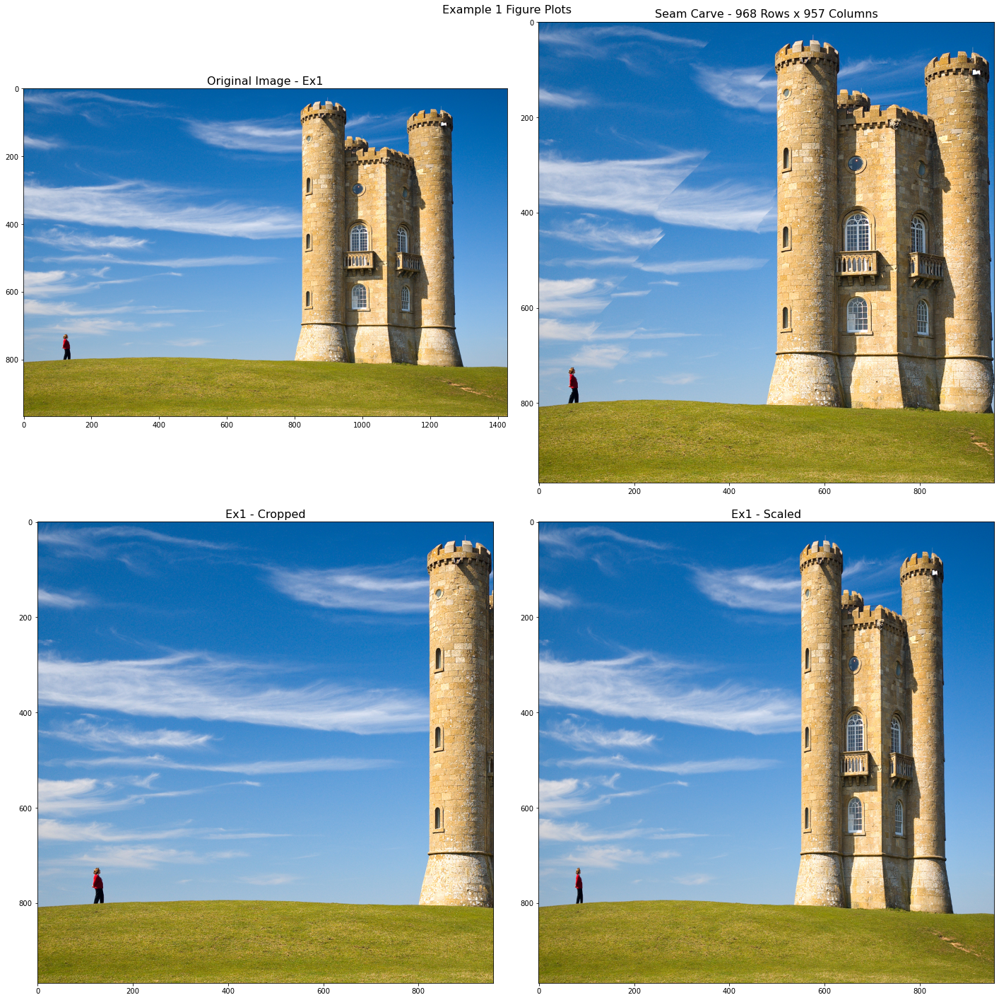

In [69]:
ex1 = cv2.cvtColor(cv2.imread("ex1.jpg"), cv2.COLOR_BGR2RGB)
carved_ex1 = seam_carve(ex1, (968, 957))
cropped_ex1 = ex1[0:969, 0:958]
resized_ex1 = cv2.resize(ex1, (957, 968))

show_plots([ex1,
            carved_ex1,
            cropped_ex1,
            resized_ex1],
            ["Original Image - Ex1",
            "Seam Carve - 968 Rows x 957 Columns",
            "Ex1 - Cropped",
            "Ex1 - Scaled",
            "Example 1 Figure Plots"])

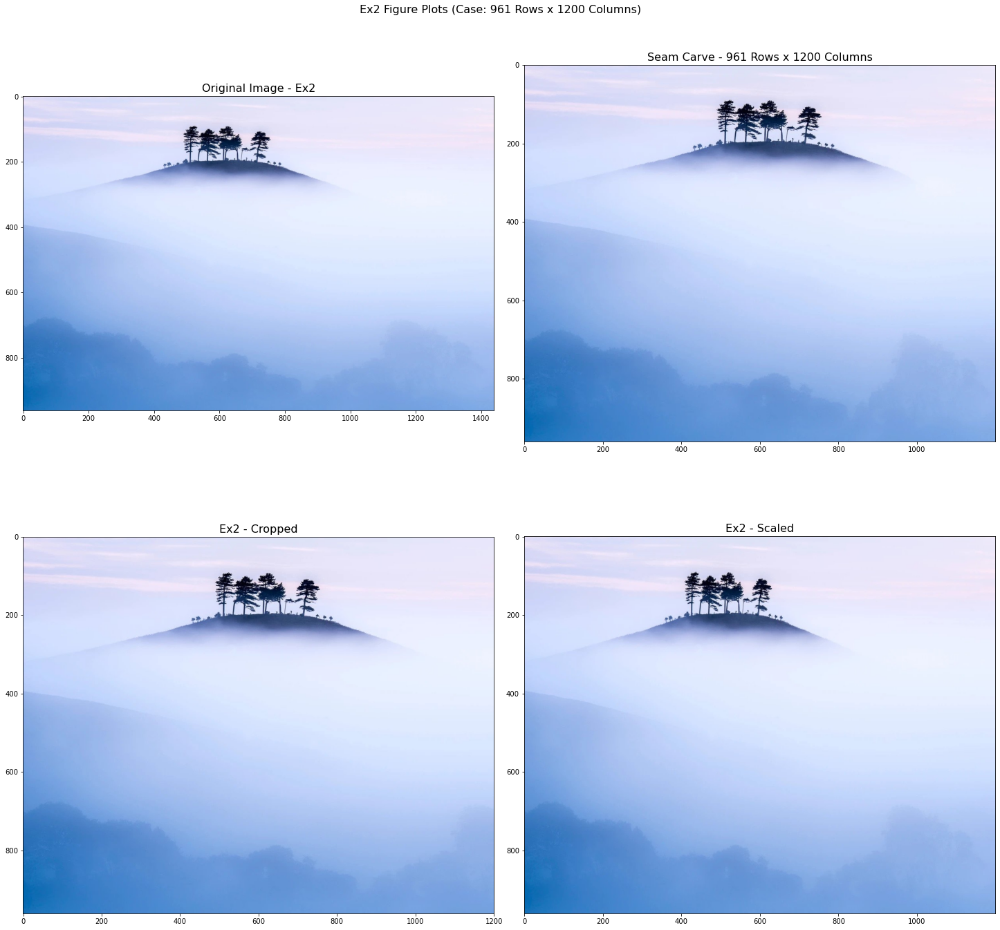

In [59]:
ex2 = cv2.cvtColor(cv2.imread("ex2.jpg"), cv2.COLOR_BGR2RGB)

carved_ex2_1 = seam_carve(ex2, (961, 1200))
cropped_ex2_1 = ex2[0:962, 0:1201]
resized_ex2_1 = cv2.resize(ex2, (1200, 961))
show_plots([ex2,
            carved_ex2_1,
            cropped_ex2_1,
            resized_ex2_1],
            ["Original Image - Ex2",
            "Seam Carve - 961 Rows x 1200 Columns",
            "Ex2 - Cropped",
            "Ex2 - Scaled",
            "Ex2 Figure Plots (Case: 961 Rows x 1200 Columns)"])

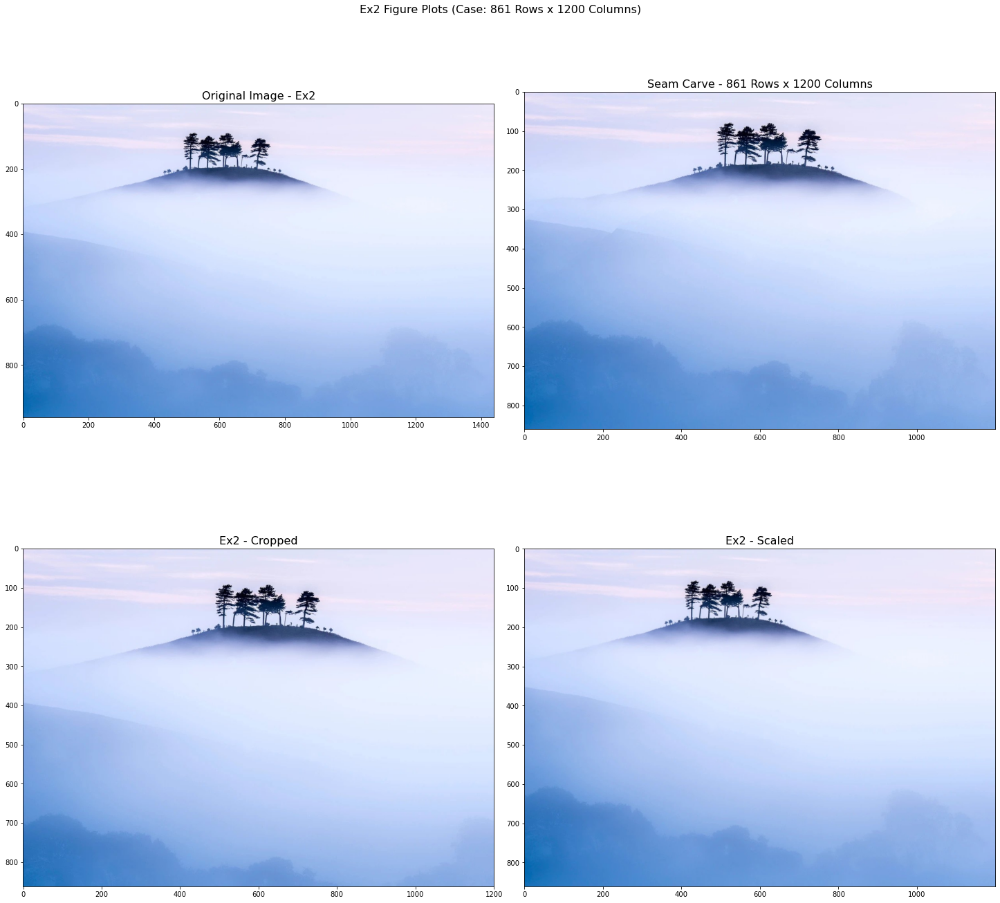

In [60]:
carved_ex2_2 = seam_carve(ex2, (861, 1200))
cropped_ex2_2 = ex2[0:862, 0:1201]
resized_ex2_2 = cv2.resize(ex2, (1200, 861))

show_plots([ex2,
            carved_ex2_2,
            cropped_ex2_2,
            resized_ex2_2],
            ["Original Image - Ex2",
            "Seam Carve - 861 Rows x 1200 Columns",
            "Ex2 - Cropped",
            "Ex2 - Scaled",
            "Ex2 Figure Plots (Case: 861 Rows x 1200 Columns)"])

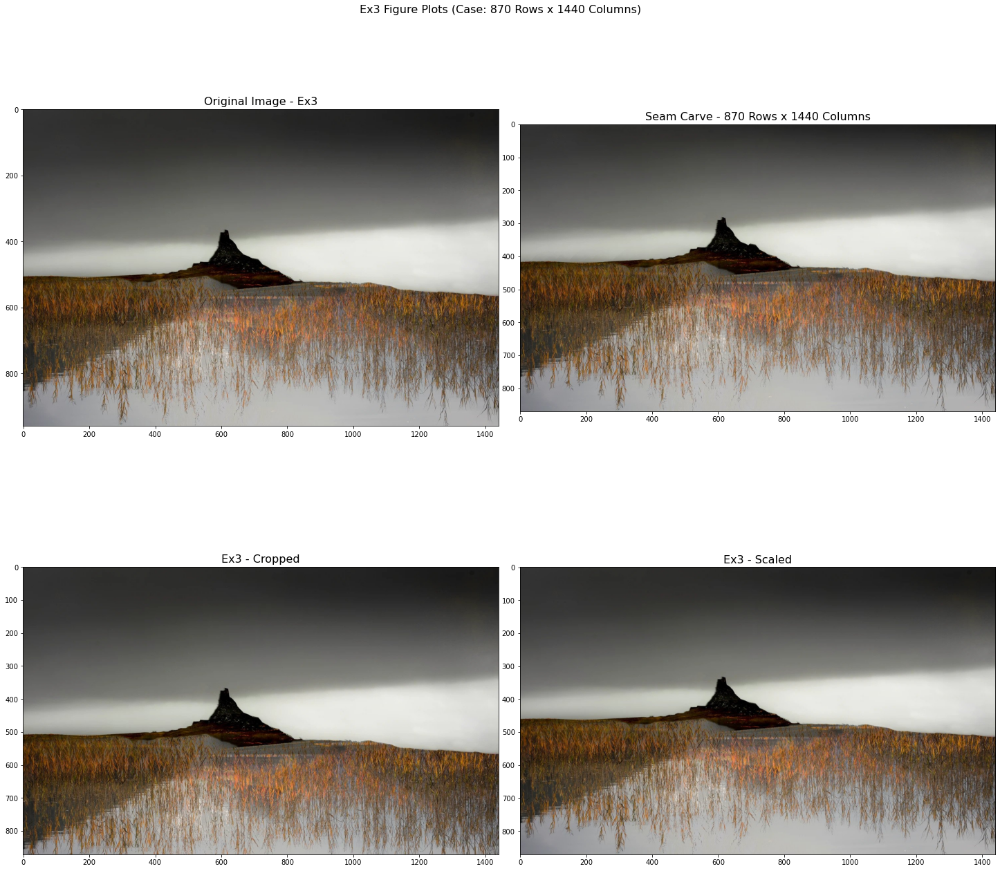

In [61]:
ex3 = cv2.cvtColor(cv2.imread("ex3.jpg"), cv2.COLOR_BGR2RGB)

carved_ex3_1 = seam_carve(ex3, (870, 1440))
cropped_ex3_1 = ex3[0:871, 0:1441]
resized_ex3_1 = cv2.resize(ex3, (1440, 870))

show_plots([ex3,
            carved_ex3_1,
            cropped_ex3_1,
            resized_ex3_1],
           ["Original Image - Ex3",
            "Seam Carve - 870 Rows x 1440 Columns",
            "Ex3 - Cropped",
            "Ex3 - Scaled",
            "Ex3 Figure Plots (Case: 870 Rows x 1440 Columns)"])

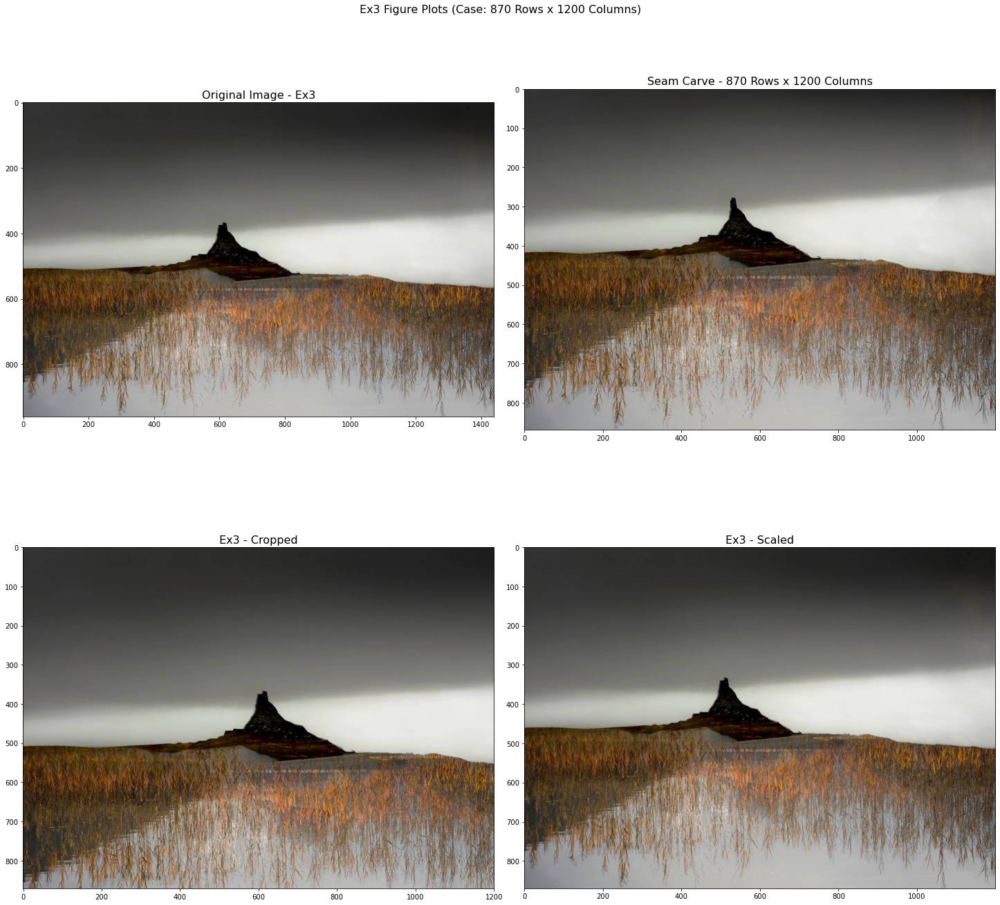

In [62]:
carved_ex3_2 = seam_carve(ex3, (870, 1200))
cropped_ex3_2 = ex3[0:871, 0:1201]
resized_ex3_2 = cv2.resize(ex3, (1200, 870))

show_plots([ex3,
            carved_ex3_2,
            cropped_ex3_2,
            resized_ex3_2],
           ["Original Image - Ex3",
            "Seam Carve - 870 Rows x 1200 Columns",
            "Ex3 - Cropped",
            "Ex3 - Scaled",
            "Ex3 Figure Plots (Case: 870 Rows x 1200 Columns)"])